# Street Network Analysis of Canada Water

## Jihun Jung - MSc Social and Geographic Data Science

### (Word Count: 300)

Canada Water, once a bustling network of docks, is now undergoing a major regeneration. The Canada Water Masterplan, led by British Land, envisions a dynamic new town centre with 3,500 homes and a modern commercial district. While the area boasts strongs transport links to West End and Canary Wharf, inadequate road networks and fragmented urban spaces continue to impede commercial growth. This study explores the impact of street connectivity on business presence using OSMnx and NetworkX, with findings aimed at identifying key areas for transformation and informing future retail investments.

![The Canada Water Masterplan (Source: British Land)](canada_water_masterplan.jpg)
The Canada Water Masterplan (Source: British Land)

## 1. Loading Libraries

In [66]:
# Import all libraries used for this project

# Pandas for data analysis and manipulation  
import pandas as pd  

# NumPy for numerical computations, including array operations and mathematical functions  
import numpy as np  

# NetworkX for creating, manipulating, and analysing graph and network structures  
import networkx as nx  

# OSMnx for retrieving, modelling, and visualising street networks from OpenStreetMap  
import osmnx as ox  

# GeoPandas for handling geospatial data, including shapefiles and geographic coordinates  
import geopandas as gpd  

# Contextily for adding basemaps to geospatial visualisations  
import contextily as ctx  

# Matplotlib Pyplot for generating static, animated, and interactive plots  
import matplotlib.pyplot as plt  

# Colormap module for handling colour gradients and normalisation in visualisations  
import matplotlib.cm as cm  

# Colours module for defining, manipulating, and normalising colour values in Matplotlib  
import matplotlib.colors as colors  

## 2. Loading & Preliminary Analysis of Canada Water Street Network

In [67]:
# Define the location for extracting the street network
location = 'Canada Water Station, London, UK'

# Get latitude and longitude of the location
latitude, longitude = ox.geocode(location)

# Download the street network as a graph (set 'network_type' to 'drive' for vehicle-accessible roads)
G = ox.graph_from_point((latitude, longitude), dist=2000, network_type='drive')

# Print basic network statistics for validation
print(ox.basic_stats(G))

{'n': 2801, 'm': 6008, 'k_avg': 4.2898964655480185, 'edge_length_total': 392312.83435928694, 'edge_length_avg': 65.29840784941527, 'streets_per_node_avg': 2.468761156729739, 'streets_per_node_counts': {0: 0, 1: 826, 2: 66, 3: 1688, 4: 214, 5: 5, 6: 2}, 'streets_per_node_proportions': {0: 0.0, 1: 0.2948946804712603, 2: 0.023563013209568013, 3: 0.6026419136022849, 4: 0.07640128525526597, 5: 0.001785076758300607, 6: 0.0007140307033202428}, 'intersection_count': 1975, 'street_length_total': 217304.03450205104, 'street_segment_count': 3419, 'street_length_avg': 63.55777551975754, 'circuity_avg': 1.0649988009022255, 'self_loop_proportion': 0.00233986545773618}


In [68]:
# Compute basic street network statistics
stats = ox.basic_stats(G)

# Extract key metrics
num_nodes = stats['n']
num_edges = stats['m']
avg_node_degree = stats['k_avg']
avg_street_length = stats['street_length_avg']
avg_streets_per_node = stats['streets_per_node_avg']
total_street_length = stats['street_length_total']
intersection_count = stats['intersection_count']
circuity_avg = stats['circuity_avg']
self_loop_proportion = stats['self_loop_proportion']

# Print basic network overview
print("Basic Network Overview:\n")

print(f"Street Network has {num_nodes} nodes and {num_edges} edges, "
      f"with an average of {avg_node_degree:.2f} connections per node.")

if avg_node_degree >= 4:
    print("This suggests a well-connected network with a mix of 4-way intersections and high connectivity.\n")
else:
    print("A lower value suggests the presence of T-junctions and cul-de-sacs, reducing connectivity.\n")

print(f"The total street length is {total_street_length:.2f}m, "
      f"with an average street segment length of {avg_street_length:.2f}m.")

if avg_street_length <= 70:
    print("Shorter segments (~50-70m) indicate a dense urban grid with frequent intersections.\n")
else:
    print("Longer segments suggest a suburban or arterial road layout with fewer intersections.\n")

print(f"On average, each node connects to {avg_streets_per_node:.2f} streets, "
      f"and there are {intersection_count} intersections in the network.")

if avg_streets_per_node <= 2.5:
    print("This indicates moderate connectivity, with a mix of T-junctions and some dead-ends.\n")
else:
    print("This suggests a highly connected grid-like street network, often seen in city centers.\n")

print("The difference between avg_node_degree and avg_streets_per_node is due to "
      "duplicate edges from bi-directional streets in avg_node_degree.\n")

# Print network efficiency and structure
print("\nNetwork Efficiency and Structure:\n")

print(f"The average circuity is {circuity_avg:.2f}, indicating how direct travel routes are.")
if circuity_avg <= 1.1:
    print("A value close to 1 suggests that streets follow a highly direct path.\n")
else:
    print("Higher values indicate winding roads, detours, or irregular street layouts.\n")

print(f"The proportion of self-looping streets in the network is {self_loop_proportion * 100:.2f}%.")
if self_loop_proportion < 0.5:
    print("This suggests very few self-looping streets, indicating an efficient network layout.")
else:
    print("A higher proportion of loops could indicate roundabouts, dead-ends, or complex road structures.")

Basic Network Overview:

Street Network has 2801 nodes and 6008 edges, with an average of 4.29 connections per node.
This suggests a well-connected network with a mix of 4-way intersections and high connectivity.

The total street length is 217304.03m, with an average street segment length of 63.56m.
Shorter segments (~50-70m) indicate a dense urban grid with frequent intersections.

On average, each node connects to 2.47 streets, and there are 1975 intersections in the network.
This indicates moderate connectivity, with a mix of T-junctions and some dead-ends.

The difference between avg_node_degree and avg_streets_per_node is due to duplicate edges from bi-directional streets in avg_node_degree.


Network Efficiency and Structure:

The average circuity is 1.06, indicating how direct travel routes are.
A value close to 1 suggests that streets follow a highly direct path.

The proportion of self-looping streets in the network is 0.23%.
This suggests very few self-looping streets, indic

## 3. Visualising Canada Water Street Network

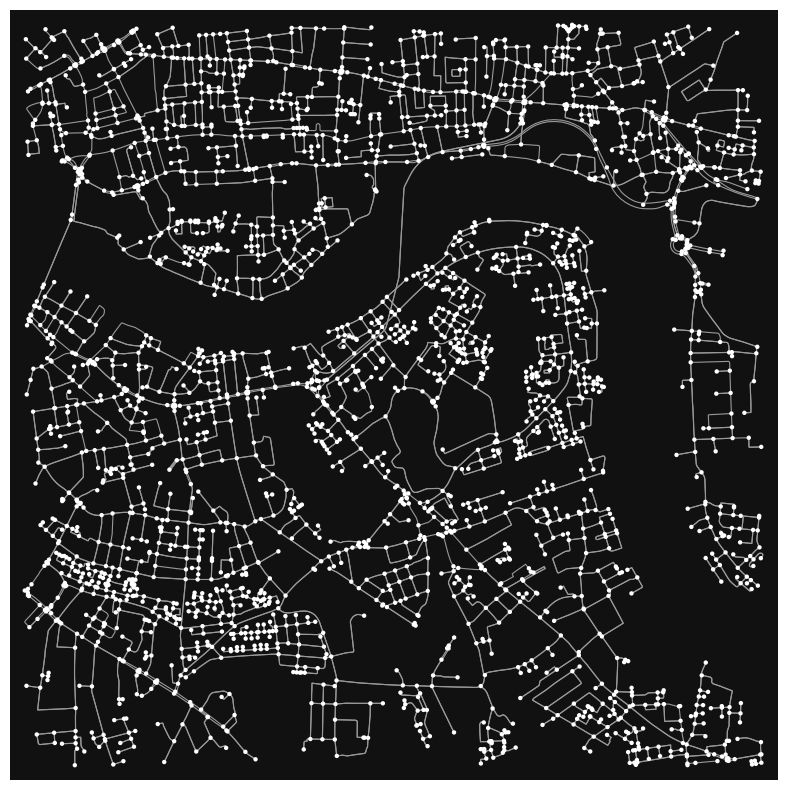

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

In [69]:
# Plot the street graph network using plot_graph() method
ox.plot_graph(G, figsize=(10, 10), node_size = 10, edge_linewidth = 0.8)

In [84]:
# Convert the graph G to a GeoDataFrame (only extract edges for efficiency)
gdf_edges = ox.graph_to_gdfs(G, nodes=False)

# Ensure CRS is set to EPSG:3857 for compatibility with basemaps
gdf_edges = gdf_edges.to_crs(epsg=3857)

# Create and display an interactive map
base_map = gdf_edges.explore(
    color="blue",
    tiles="OpenStreetMap",
    line_width=1.5,
    legend=False
)

# Display the interactive map
base_map

## 4. Centrality Analysis of Canada Water Street network

### 4.1. Closeness Centrality

In [71]:
# Convert the street networks to a directed graph, as some centrality measures are not implemented for MultiGraph
DG = ox.convert.to_digraph(G)

In [72]:
# Convert the directed graph to a line graph, so that edges become nodes - this allows us to compute edge-based centrality measures
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

In [73]:
# Assign edge closeness centrality values to the original graph's edges
nx.set_edge_attributes(DG,edge_cc,'cc')

# Convert the directed graph back to a MultiGraph to match the original format
G1 = nx.MultiGraph(DG)

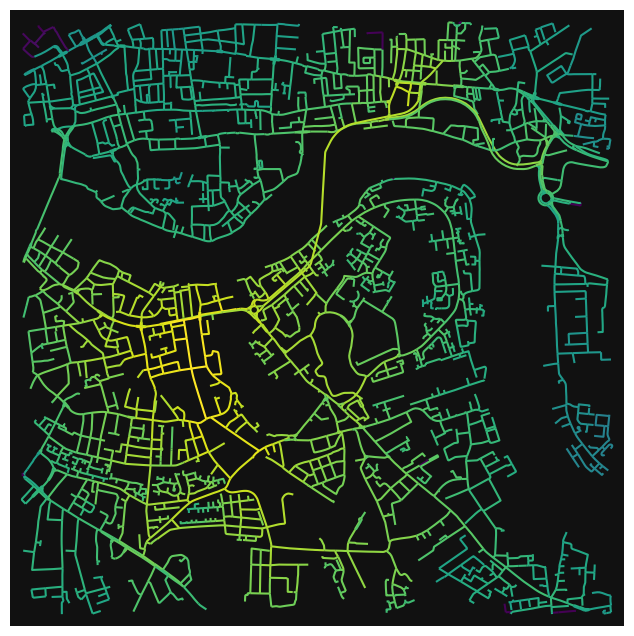

In [74]:
# Generate edge colours based on closeness centrality for visualisation
edge_colours = ox.plot.get_edge_colors_by_attr(G1, 'cc', cmap='viridis')

# plot the graph and colour edges by closenss centrality
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=edge_colours, edge_linewidth=1.5, edge_alpha=1)

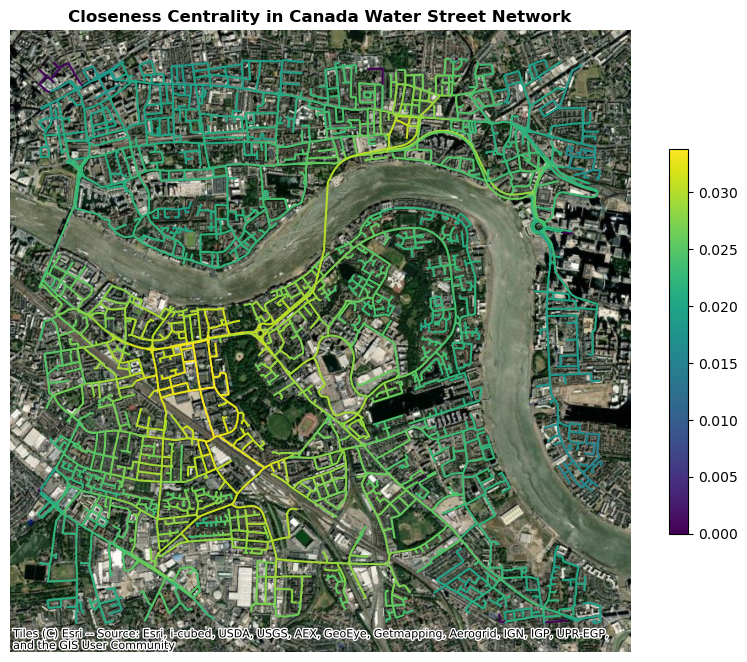

In [75]:
# Convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1, nodes=False, fill_edge_geometry=True)

# Reproject to EPSG:3857 (Web Mercator) for compatibility with contextily basemaps
gdf_edges = gdf_edges.to_crs(epsg=3857)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# Plot edges according to closeness centrality
gdf_edges.plot(
    column='cc', cmap='viridis', legend=True, ax=ax,
    legend_kwds={
        'shrink': 0.5
    }
)

# Add a Esri WorldImagery satellite image basesmap
ctx.add_basemap(ax,source=ctx.providers.Esri.WorldImagery)

# Add title and remove axes
plt.title("Closeness Centrality in Canada Water Street Network", weight='bold', loc='center')
plt.axis('off')
plt.show()

The closeness centrality analysis of Canada Water’s road network highlights significant connectivity challenges. Bermondsey, located west of Southwark Park, exhibits the highest centrality, suggesting better accessibility and commercial potential. In contrast, Canada Water’s lower centrality is attributed to fragmented infrastructure, low-density retail spaces, and underdeveloped road layout. Additionally, limited direct road access to Canary Wharf, constrained by the River Thames, further reduces connectivity.

### 4.2. Betweenness Centrality

In [76]:
# Convert the directed graph to a line graph, so that edges become nodes - this allows us to compute edge-based centrality measures
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

In [77]:
# Assign edge between centrality values to the original graph's edges
nx.set_edge_attributes(DG,edge_bc,'bc')

# Convert the directed graph back to a MultiGraph to match the original format
G1 = nx.MultiGraph(DG)

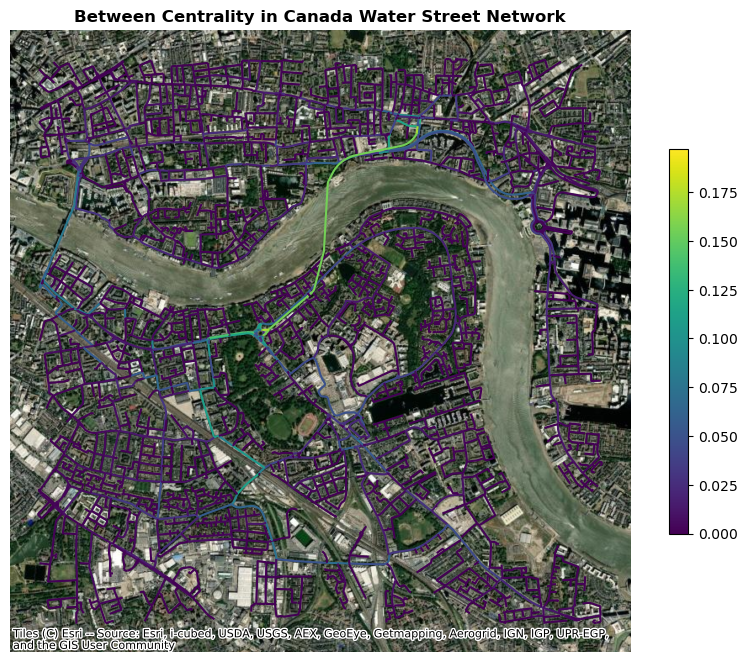

In [78]:
# Convert graph to geopandas dataframe
gdf_edges = ox.graph_to_gdfs(G1, nodes=False, fill_edge_geometry=True)

# Reproject to EPSG:3857 (Web Mercator) for compatibility with contextily basemaps
gdf_edges = gdf_edges.to_crs(epsg=3857)

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 10))

# Plot edges according to between centrality
gdf_edges.plot(
    column='bc', cmap='viridis', legend=True, ax=ax,
    legend_kwds={
        'shrink': 0.5
    }
)

# Add a Esri WorldImagery satellite image basesmap
ctx.add_basemap(ax,source=ctx.providers.Esri.WorldImagery)

# Add title and remove axes
plt.title("Between Centrality in Canada Water Street Network", weight='bold', loc='center')
plt.axis('off')
plt.show()

The betweenness analysis highlights the additional connectivity challenges, where most local roads exhibit low betweenness and depend on a few key routes, exacerbating congestion risks. High-betweenness roads are concentrated in Bermondsey, further strengthening its commercial viability. Limited connections to Canary Wharf increase reliance on the Rotherhithe Tunnel, restricting traffic flow and impeding commercial accessibility.

## 5. Urban Form Analysis

In [79]:
# Define the location to extract the street network
location = 'Canada Water Station, London, UK'

# Download and extract 'landuse' and 'building' features from location
tags= tags={'building':True}
all_geom=ox.features_from_address(location, tags, dist=2000)
all_geom = all_geom.to_crs(epsg=3857)

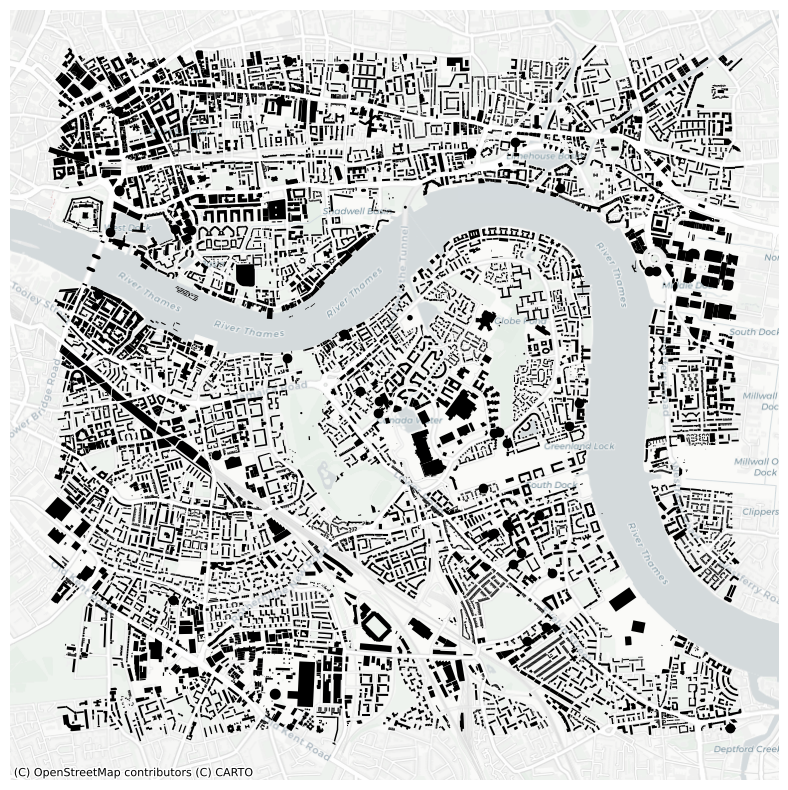

In [80]:
# Create a figure and axis for plotting with a fixed size
fig,ax = plt.subplots(figsize=(10,10))

# Plot all geometries where 'buildings' is not missing
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black')

# Add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# Remove axis labels and display the plot
plt.axis('off')
plt.show()

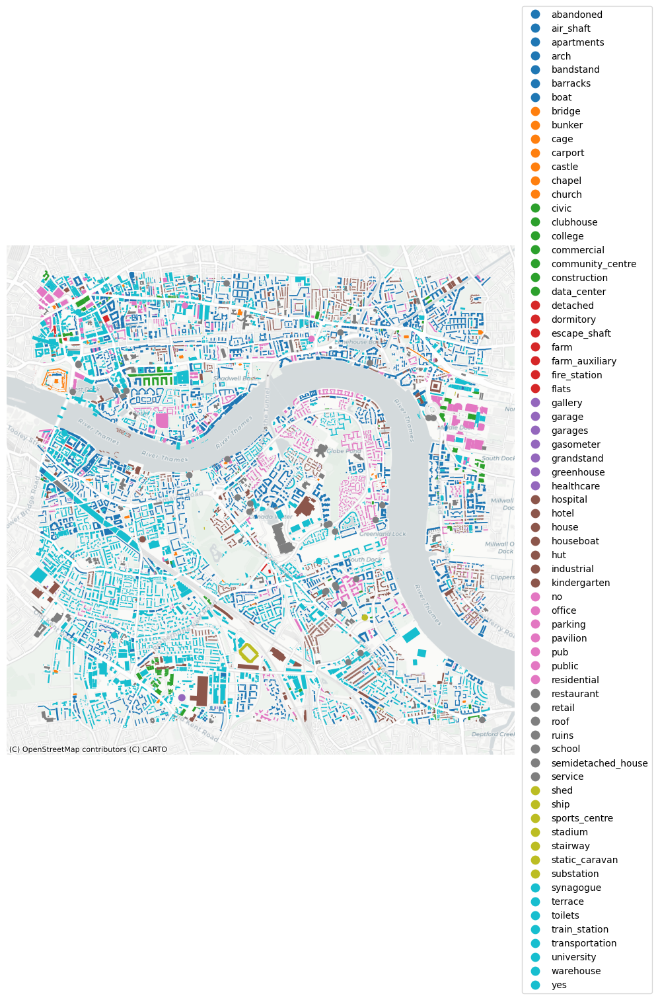

In [81]:
# Create a figure and axis
fig,ax = plt.subplots(figsize=(10,10))

# Plot all geometries where 'building' is not missing
# 'categorical=True' shows distinct colours for each building category
all_geom[all_geom['building'].notna()].plot('building',
                                            ax=ax,
                                            categorical=True,
                                            legend=True,
                                            legend_kwds={'bbox_to_anchor': (1.28, 0.5), 'loc': 'right'})

# Add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# Remove axis labels
plt.axis('off')
plt.show()

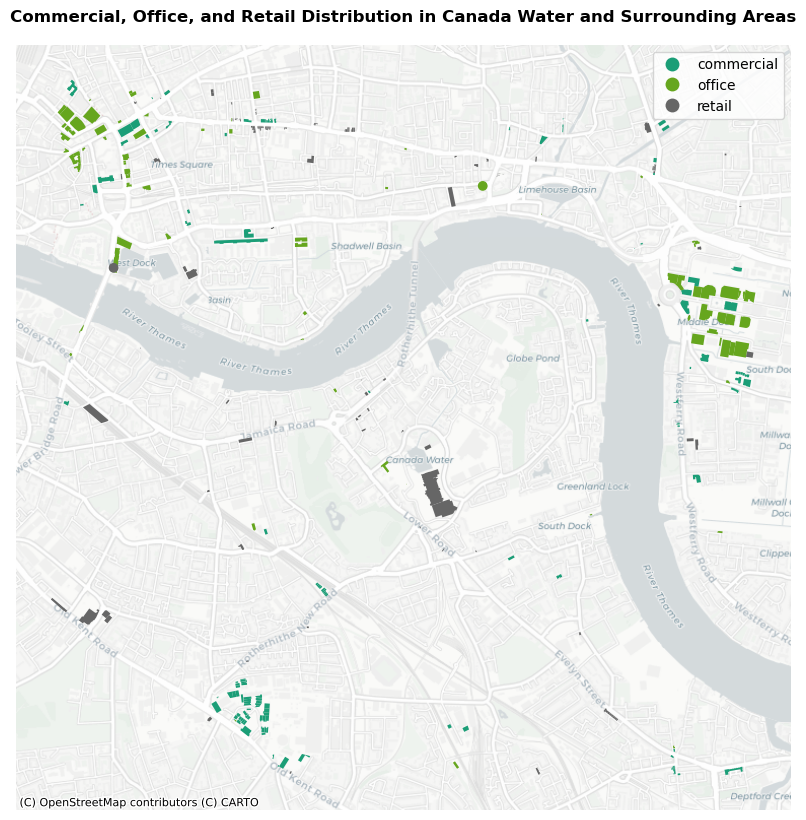

In [82]:
# Create a figure and axis
fig,ax = plt.subplots(figsize=(10,10))

# Filter the GeoDataFrame to include only features where 'landuse' is either 'retail', 'commercial', or 'office'
filtered_geom = all_geom[
    all_geom['building'].notna() & 
    all_geom['building'].str.contains('retail|commercial|office', case=False, na=False)
]

# Plot the filtered GeoDataFrame
filtered_geom.plot(
    ax=ax,
    column='building',
    cmap='Dark2',
    legend=True,
    legend_kwds={'loc': 'upper right'}
)

# Add a CartoDB Positron basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

# Remove axis labels and display the plot
plt.title("Commercial, Office, and Retail Distribution in Canada Water and Surrounding Areas", weight='bold', loc='center')
plt.axis('off')
plt.show()

Canada Water’s commercial landscape remains underdeveloped compared to Bermondsey and Canary Wharf, which benefit from stronger business presence and accessibility. Low betweenness centrality, fragmented infrastructure, and natural barriers like parks and docks hinder commercial clustering. Despite its proximity to Canary Wharf, weak road integration limits connectivity, with the Rotherhithe Tunnel as the only link. Bermondsey’s existing commercial hub and high-connectivity roads west of Southwark park currently present stronger investment prospects than Canada Water. To realise the Masterplan, planners must prioritise road integration, develop high-betweenness corridors, and create accessible office and retail clusters.

**Bibliography:**

Canada Water. (2025). The Canada Water London British Land. [online] Available at: https://canadawater.co.uk/vision/masterplan/.

Allies and Morrison. (n.d.). Allies and Morrison - Green and blue. [online] Available at: https://www.alliesandmorrison.com/projects/canada-water-masterplan.